# Experiment 1: Late-fusion

### Text + Audio
- Best TER model on MELD:
- Best SER model on MELD:

### Text + Audio + Image
- Best TER model on MELD:
- Best SER model on MELD:
- Deepface

In [ ]:
import os
import tempfile
import cv2
import whisper
import librosa
from PyPDF2 import PdfReader
from docx import Document
from moviepy.editor import AudioFileClip
from PIL import Image

class FileProcessor:
    def __init__(self):
        """
        Efficient multimodal file processor:
        - Extracts text, audio, images, and videos.
        - Does not perform face detection (handled in recognizers).
        """
        self.file_types = {
            'text': ['txt', 'pdf', 'docx'],
            'audio': ['mp3', 'wav', 'sph'],
            'image': ['jpg', 'jpeg', 'png'],
            'video': ['mp4', 'avi', 'mov', 'webm']
        }
        self.transcriber = whisper.load_model("base")

    # -------------------------
    # MAIN DISPATCHER
    # -------------------------
    def process_file(self, file_path):
        if not os.path.isfile(file_path):
            return {"error": "File not found"}

        file_type = self._detect_file_type(file_path)

        try:
            if file_type == 'text':
                return self._process_text(file_path)
            elif file_type == 'audio':
                return self._process_audio(file_path)
            elif file_type == 'image':
                return self._process_image(file_path)
            elif file_type == 'video':
                return self._process_video(file_path)
            else:
                return {"error": "Unsupported file type"}
        except Exception as e:
            return {"error": str(e)}

    # -------------------------
    # FILE TYPE DETECTION
    # -------------------------
    def _detect_file_type(self, file_path):
        ext = file_path.split('.')[-1].lower()
        for category, extensions in self.file_types.items():
            if ext in extensions:
                return category
        return 'unknown'

    # -------------------------
    # TEXT
    # -------------------------
    def _process_text(self, file_path):
        ext = file_path.split('.')[-1].lower()
        text = ''

        if ext == 'txt':
            with open(file_path, 'r', encoding='utf-8', errors='ignore') as f:
                text = f.read()
        elif ext == 'pdf':
            with open(file_path, 'rb') as f:
                reader = PdfReader(f)
                text = '\n'.join(page.extract_text() or "" for page in reader.pages)
        elif ext == 'docx':
            doc = Document(file_path)
            text = '\n'.join(p.text for p in doc.paragraphs)

        return {"text": text}

    # -------------------------
    # AUDIO
    # -------------------------
    def _process_audio(self, file_path):
        """Transcribe and load audio efficiently."""
        audio, sr = librosa.load(file_path, sr=16000)
        transcript = self.transcriber.transcribe(file_path)

        segments = [
            {'start': s['start'], 'end': s['end'], 'text': s['text']}
            for s in transcript.get('segments', [])
        ]

        return {
            "text": transcript.get('text', ''),
            "segments": segments,
            "audio": {
                "raw": audio,
                "sample_rate": sr
            }
        }

    # -------------------------
    # IMAGE
    # -------------------------
    def _process_image(self, file_path):
        """Return raw RGB image only (no detection)."""
        img = Image.open(file_path).convert("RGB")
        return {"image": img}

    # -------------------------
    # VIDEO (FAST)
    # -------------------------
    def _process_video(self, file_path, frame_rate=1.0, max_frames=100):
        """
        Efficiently extract frames and audio from a video file.
        - No full video load.
        - Samples frames every `frame_rate` seconds.
        - Limits to `max_frames` to save memory.
        """
        result = {}

        # --- Extract audio only (no full video load) ---
        with tempfile.NamedTemporaryFile(suffix='.wav') as tmp_audio:
            try:
                audio_clip = AudioFileClip(file_path)
                audio_clip.write_audiofile(tmp_audio.name, verbose=False, logger=None)
                audio_result = self._process_audio(tmp_audio.name)
                result.update(audio_result)
            except Exception as e:
                result["audio"] = None
                result["text"] = None
                print(f"Audio extraction failed: {e}")

        # --- Sample frames efficiently ---
        cap = cv2.VideoCapture(file_path)
        fps = cap.get(cv2.CAP_PROP_FPS)
        if fps <= 0:
            fps = 25  # fallback

        frame_interval = int(fps * frame_rate)
        frames = []
        frame_idx = 0

        total_frames = int(cap.get(cv2.CAP_PROP_FRAME_COUNT))

        while cap.isOpened() and len(frames) < max_frames:
            ret, frame = cap.read()
            if not ret:
                break

            if frame_idx % frame_interval == 0:
                rgb = cv2.cvtColor(frame, cv2.COLOR_BGR2RGB)
                frames.append(Image.fromarray(rgb))

            frame_idx += 1

        cap.release()

        result["frames"] = frames
        result["fps"] = fps
        result["total_frames"] = total_frames

        return result


In [3]:
import os, sys
import pandas as pd
import librosa
import torch
import numpy as np

from tqdm import tqdm
tqdm.pandas()
module_path = os.path.abspath(os.path.join('..', '..')) # or the path to your source code
sys.path.insert(0, module_path)
from src.data_loading import filter_emotions, load_meld
from src.fusion import LateFusion

#meld_train = load_meld(split='train')
#meld_val = load_meld(split='dev')
meld_test = filter_emotions(load_meld(split='test'))  # smaller subset for testing

# process file
file_processor = FileProcessor()
#meld_test['processed'] = meld_test['filename'].progress_apply(file_processor.process_file)
meld_test_processed_50 = meld_test['filename'].sample(50).progress_apply(file_processor.process_file)

Subfolders in the dataset: ['JSON files', 'MELD.Raw']
Subfolders in the raw data: ['dia47_utt11.mp4', 'dia35_utt2.mp4', 'dia47_utt9.mp4', 'dia167_utt14.mp4', 'dia232_utt4.mp4', '._dia118_utt11.mp4', 'dia34_utt2.mp4', 'dia268_utt8.mp4', 'dia233_utt4.mp4', '._dia39_utt1.mp4', '._dia230_utt3.mp4', 'dia137_utt0.mp4', '._dia268_utt11.mp4', '._dia231_utt3.mp4', 'dia136_utt0.mp4', '._dia38_utt1.mp4', '._dia34_utt16.mp4', '._dia128_utt2.mp4', 'dia28_utt7.mp4', 'dia195_utt8.mp4', 'dia22_utt15.mp4', '._dia129_utt2.mp4', '._dia100_utt5.mp4', 'dia29_utt7.mp4', 'dia103_utt2.mp4', 'final_videos_testdia48_utt3.mp4', 'dia154_utt12.mp4', '._dia95_utt11.mp4', '._dia205_utt1.mp4', 'dia102_utt2.mp4', 'dia107_utt8.mp4', 'dia253_utt11.mp4', '._dia52_utt5.mp4', 'dia175_utt3.mp4', 'dia93_utt0.mp4', '._dia272_utt0.mp4', '._dia192_utt5.mp4', 'dia174_utt3.mp4', '._dia53_utt5.mp4', 'dia175_utt13.mp4', 'dia92_utt0.mp4', 'dia191_utt2.mp4', 'dia77_utt1.mp4', 'dia259_utt0.mp4', 'dia270_utt7.mp4', 'dia123_utt11.mp4', 

  0%|          | 0/50 [00:00<?, ?it/s]/Users/krazmic/Documents/GitHub/Repos/EmoReA/.venv/lib/python3.11/site-packages/librosa/core/intervals.py:8: UserWarning: pkg_resources is deprecated as an API. See https://setuptools.pypa.io/en/latest/pkg_resources.html. The pkg_resources package is slated for removal as early as 2025-11-30. Refrain from using this package or pin to Setuptools<81.
  from pkg_resources import resource_filename
/Users/krazmic/Documents/GitHub/Repos/EmoReA/.venv/lib/python3.11/site-packages/whisper/transcribe.py:115: UserWarning: FP16 is not supported on CPU; using FP32 instead
  warnings.warn("FP16 is not supported on CPU; using FP32 instead")
  4%|▍         | 2/50 [00:02<00:52,  1.10s/it]/Users/krazmic/Documents/GitHub/Repos/EmoReA/.venv/lib/python3.11/site-packages/whisper/transcribe.py:115: UserWarning: FP16 is not supported on CPU; using FP32 instead
  warnings.warn("FP16 is not supported on CPU; using FP32 instead")
  6%|▌         | 3/50 [00:02<00:44,  1.05it/s

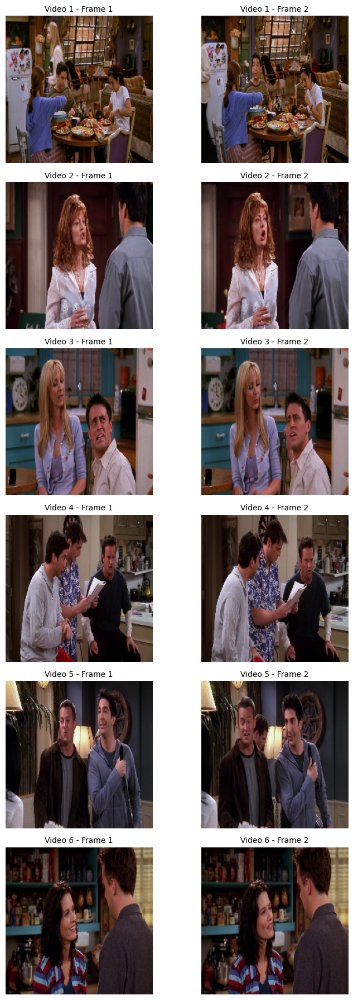

In [5]:
import matplotlib.pyplot as plt
import random

def plot_sample_frames(processed_series, n_samples=6, n_frames=2):
    """
    Show n_frames frames per video from processed video dicts.
    Each row = one sample, each column = one frame.
    """
    # Filter out entries that have 'frames'
    valid_samples = [item for item in processed_series if isinstance(item, dict) and "frames" in item]
    if not valid_samples:
        print("No valid video frames found.")
        return
    
    # Randomly pick n_samples videos
    selected = random.sample(valid_samples, k=min(n_samples, len(valid_samples)))
    
    # Create figure grid
    fig, axes = plt.subplots(len(selected), n_frames, figsize=(4 * n_frames, 3 * len(selected)))
    
    # Handle case when n_samples or n_frames == 1
    if len(selected) == 1:
        axes = [axes]
    if n_frames == 1:
        axes = [[ax] for ax in axes]
    
    for i, sample in enumerate(selected):
        frames = sample.get("frames", [])
        chosen_frames = frames[:n_frames] if len(frames) >= n_frames else frames
        
        for j, frame in enumerate(chosen_frames):
            ax = axes[i][j]
            ax.imshow(frame)
            ax.axis("off")
            ax.set_title(f"Video {i+1} - Frame {j+1}", fontsize=10)
        
        # Turn off any extra empty axes
        for j in range(len(chosen_frames), n_frames):
            axes[i][j].axis("off")
    
    plt.tight_layout()
    plt.show()


plot_sample_frames(meld_test_processed_50, n_samples=6, n_frames=2)


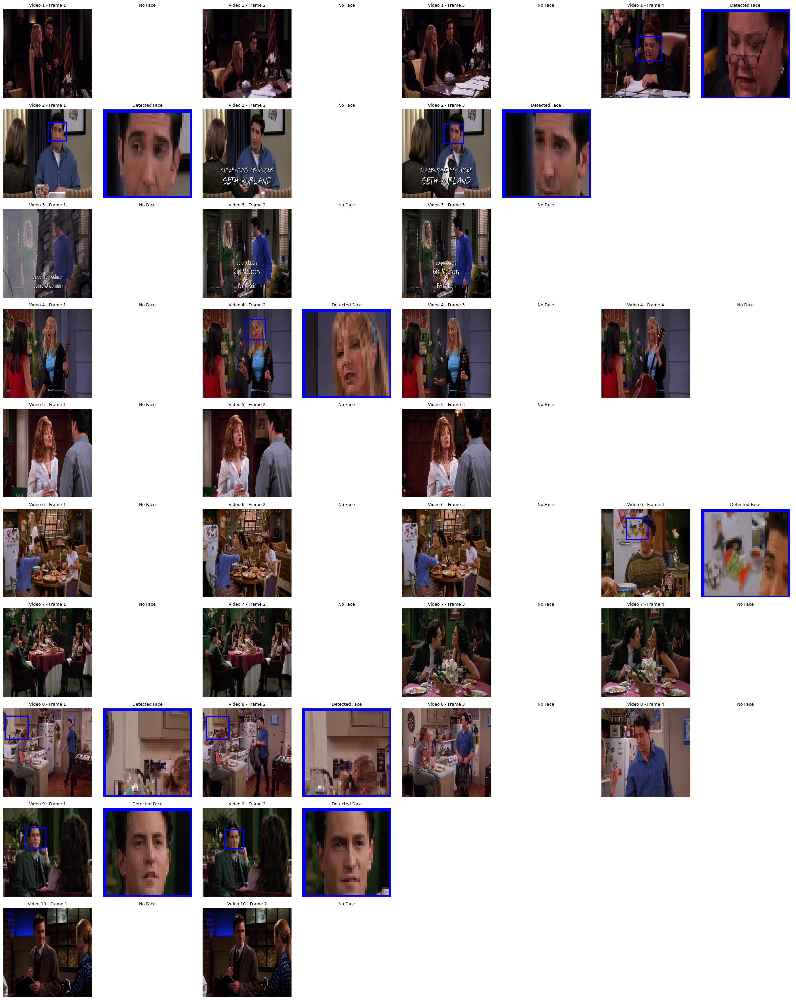

In [16]:
import matplotlib.pyplot as plt
import random
import cv2
import numpy as np

def plot_sample_frames_with_faces(processed_series, n_samples=6, n_frames=2):
    """
    Plot each video’s frames with detected face crops side-by-side.
    Grid layout: n_samples rows × (n_frames*2) columns
    """
    # Load face detector
    face_cascade = cv2.CascadeClassifier(cv2.data.haarcascades + 'haarcascade_frontalface_default.xml')

    # Filter valid samples (video dicts with frames)
    valid_samples = [item for item in processed_series if isinstance(item, dict) and "frames" in item]
    if not valid_samples:
        print("No valid video frames found.")
        return

    selected = random.sample(valid_samples, k=min(n_samples, len(valid_samples)))

    # Each frame gets original + face image → 2 per frame
    total_cols = n_frames * 2

    fig, axes = plt.subplots(n_samples, total_cols, figsize=(3 * total_cols, 3 * n_samples))

    # Handle 1D cases
    if n_samples == 1:
        axes = [axes]
    if total_cols == 1:
        axes = [[ax] for ax in axes]

    for i, sample in enumerate(selected):
        frames = sample.get("frames", [])
        chosen_frames = frames[:n_frames] if len(frames) >= n_frames else frames

        for j, frame in enumerate(chosen_frames):
            # Convert PIL to OpenCV (for face detection)
            img_cv = cv2.cvtColor(np.array(frame), cv2.COLOR_RGB2BGR)
            gray = cv2.cvtColor(img_cv, cv2.COLOR_BGR2GRAY)

            faces = face_cascade.detectMultiScale(
                gray,
                scaleFactor=1.05,   # smaller → detects smaller faces, but slower (default 1.3)
                minNeighbors=4,     # smaller → more detections (even false ones), default 5
                minSize=(40, 40),   # ignore tiny regions
                flags=cv2.CASCADE_SCALE_IMAGE
            )

            face_img = None

            if len(faces) > 0:
                (x, y, w, h) = faces[0]
                face_img = img_cv[y:y+h, x:x+w]
                cv2.rectangle(img_cv, (x, y), (x+w, y+h), (255, 0, 0), 2)

            # Convert back to RGB for display
            img_rgb = cv2.cvtColor(img_cv, cv2.COLOR_BGR2RGB)
            axes[i][2*j].imshow(img_rgb)
            axes[i][2*j].axis("off")
            axes[i][2*j].set_title(f"Video {i+1} - Frame {j+1}", fontsize=9)

            if face_img is not None:
                axes[i][2*j + 1].imshow(cv2.cvtColor(face_img, cv2.COLOR_BGR2RGB))
                axes[i][2*j + 1].axis("off")
                axes[i][2*j + 1].set_title("Detected Face", fontsize=9)
            else:
                axes[i][2*j + 1].axis("off")
                axes[i][2*j + 1].set_title("No Face", fontsize=9)

        # Hide unused axes if fewer frames
        for j in range(2 * len(chosen_frames), total_cols):
            axes[i][j].axis("off")

    plt.tight_layout()
    plt.show()

plot_sample_frames_with_faces(meld_test_processed_50, n_samples=10, n_frames=4)


In [12]:
!pip install dlib

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 3.3/3.3 MB 38.9 MB/s  0:00:00
  Installing build dependencies ... done
  Getting requirements to build wheel ... done
  Preparing metadata (pyproject.toml) ... done
  Created wheel for dlib: filename=dlib-20.0.0-cp311-cp311-macosx_15_0_arm64.whl size=2843500 sha256=b321889489fbb5ffe97b15ee84cce6eac0abcd6856d2c9c39a052c0ec18fc22b
  Stored in directory: /Users/krazmic/Library/Caches/pip/wheels/fa/e4/82/70875120d8e3f04c437bff144da98429352b3b026553d77b50
Successfully built dlib

[notice] A new release of pip is available: 25.2 -> 25.3
[notice] To update, run: pip install --upgrade pip


✅ Using dlib HOG face detector.


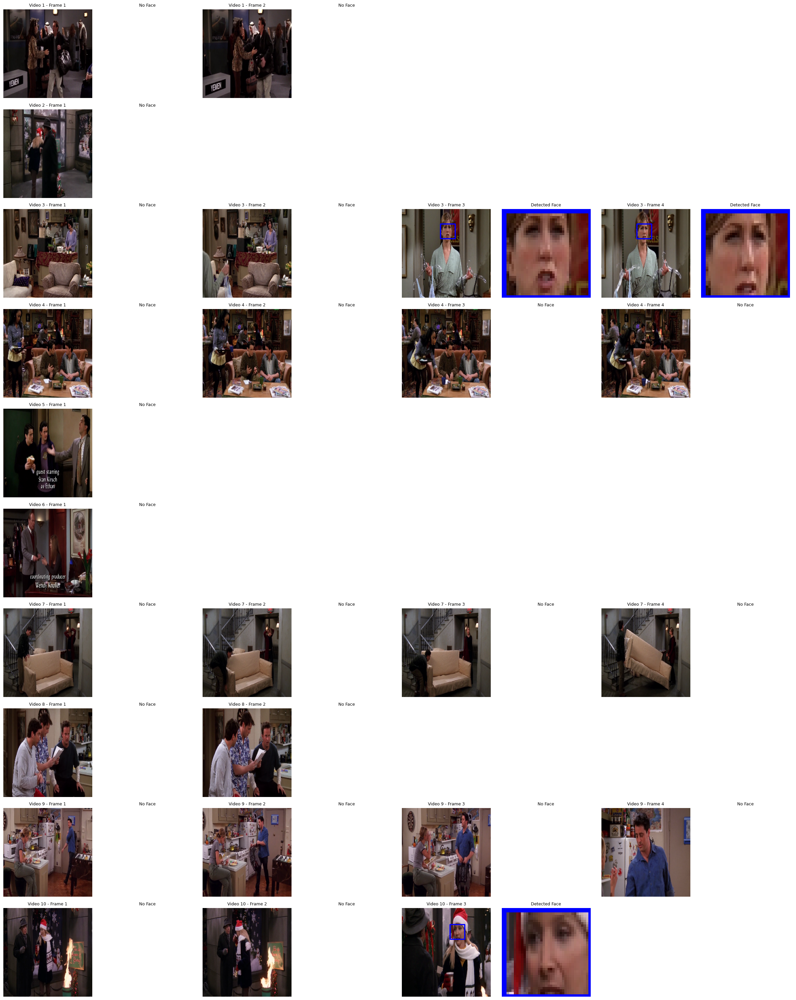

In [15]:
import matplotlib.pyplot as plt
import random
import cv2
import numpy as np
import dlib

def plot_sample_frames_with_faces(processed_series, n_samples=6, n_frames=2, use_cnn=False):
    """
    Plot video frames with dlib face detections side-by-side.
    - HOG or CNN face detector based on `use_cnn`.
    - Grid layout: n_samples rows × (n_frames*2) columns.
    """
    # Choose detector
    if use_cnn:
        # Requires pretrained model: mmod_human_face_detector.dat
        cnn_model_path = dlib.get_frontal_face_detector()  # fallback if no CNN model
        try:
            detector = dlib.cnn_face_detection_model_v1("mmod_human_face_detector.dat")
            print("✅ Using dlib CNN face detector.")
        except:
            print("⚠️ CNN model not found, using HOG fallback.")
            detector = dlib.get_frontal_face_detector()
            use_cnn = False
    else:
        detector = dlib.get_frontal_face_detector()
        print("✅ Using dlib HOG face detector.")

    # Filter valid samples
    valid_samples = [item for item in processed_series if isinstance(item, dict) and "frames" in item]
    if not valid_samples:
        print("No valid video frames found.")
        return

    selected = random.sample(valid_samples, k=min(n_samples, len(valid_samples)))
    total_cols = n_frames * 2

    fig, axes = plt.subplots(n_samples, total_cols, figsize=(3 * total_cols, 3 * n_samples))
    if n_samples == 1:
        axes = [axes]
    if total_cols == 1:
        axes = [[ax] for ax in axes]

    for i, sample in enumerate(selected):
        frames = sample.get("frames", [])
        chosen_frames = frames[:n_frames] if len(frames) >= n_frames else frames

        for j, frame in enumerate(chosen_frames):
            img_rgb = np.array(frame)
            img_cv = cv2.cvtColor(img_rgb, cv2.COLOR_RGB2BGR)

            # Detect faces
            if use_cnn:
                detections = detector(img_rgb, 1)
                faces = [(d.rect.left(), d.rect.top(), d.rect.width(), d.rect.height()) for d in detections]
            else:
                detections = detector(img_rgb, 1)
                faces = [(d.left(), d.top(), d.width(), d.height()) for d in detections]

            face_img = None

            if len(faces) > 0:
                (x, y, w, h) = faces[0]
                face_img = img_cv[y:y+h, x:x+w]
                cv2.rectangle(img_cv, (x, y), (x+w, y+h), (255, 0, 0), 2)

            # Show full frame
            axes[i][2*j].imshow(cv2.cvtColor(img_cv, cv2.COLOR_BGR2RGB))
            axes[i][2*j].axis("off")
            axes[i][2*j].set_title(f"Video {i+1} - Frame {j+1}", fontsize=9)

            # Show detected face or empty
            if face_img is not None:
                axes[i][2*j + 1].imshow(cv2.cvtColor(face_img, cv2.COLOR_BGR2RGB))
                axes[i][2*j + 1].axis("off")
                axes[i][2*j + 1].set_title("Detected Face", fontsize=9)
            else:
                axes[i][2*j + 1].axis("off")
                axes[i][2*j + 1].set_title("No Face", fontsize=9)

        for j in range(2 * len(chosen_frames), total_cols):
            axes[i][j].axis("off")

    plt.tight_layout()
    plt.show()

plot_sample_frames_with_faces(meld_test_processed_50, n_samples=10, n_frames=4, use_cnn=False)


In [17]:
import cv2
import numpy as np
from deepface import DeepFace
from tensorflow.keras.models import load_model
from tensorflow.keras.preprocessing.image import img_to_array
from PIL import Image

class FaceEmotionRecognizer:
    def __init__(self, backend='skip', cnn_model_path="/Users/krazmic/Documents/GitHub/Repos/EmoReA/emorea-backend/notebooks/facial/best_cnn_model.h5"):
        """
        Initialize the face emotion recognizer.

        Args:
            backend (str): Face detection backend ('opencv', 'mtcnn', 'retinaface', etc.)
            cnn_model_path (str, optional): Path to a custom CNN model for FER.
        """
        self.backend = backend
        self.face_cascade = cv2.CascadeClassifier(cv2.data.haarcascades + 'haarcascade_frontalface_default.xml')

        # Optionally load CNN model
        self.cnn_model = None
        self.class_labels = ['angry', 'disgust', 'fear', 'happy', 'neutral', 'sad', 'surprise']
        if cnn_model_path and os.path.exists(cnn_model_path):
            try:
                self.cnn_model = load_model(cnn_model_path)
                print(f"[INFO] Loaded CNN model from {cnn_model_path}")
            except Exception as e:
                print(f"[WARN] Failed to load CNN model: {e}")
                self.cnn_model = None

    # ------------------------------
    # FACE DETECTION
    # ------------------------------
    def detect_faces(self, image):
        """
        Detect faces using OpenCV Haar cascade.
        Returns a list of bounding boxes [(x, y, w, h), ...].
        """
        gray = cv2.cvtColor(np.array(image), cv2.COLOR_RGB2GRAY)
        faces = self.face_cascade.detectMultiScale(gray, scaleFactor=1.3, minNeighbors=5)
        return faces

    # ------------------------------
    # ANALYSIS LOGIC
    # ------------------------------
    def analyze_image(self, image):
        """
        Analyze facial emotion using DeepFace or a CNN model.
        """
        try:
            if self.cnn_model is not None:
                # CNN-based emotion recognition
                return self._analyze_with_cnn(image)
            else:
                # Default to DeepFace
                return self._analyze_with_deepface(image)
        except Exception as e:
            return {'error': str(e)}

    # ------------------------------
    # CNN MODE
    # ------------------------------
    def _analyze_with_cnn(self, image):
        """
        Detect faces and predict emotion using a CNN model.
        """
        img_array = np.array(image)
        faces = self.detect_faces(image)
        if len(faces) == 0:
            return {'error': 'No face detected'}

        emotions = []
        for (x, y, w, h) in faces:
            roi = img_array[y:y+h, x:x+w]
            roi = cv2.cvtColor(roi, cv2.COLOR_RGB2GRAY)
            roi = cv2.resize(roi, (48, 48))  # typical FER input
            roi = roi.astype("float") / 255.0
            roi = img_to_array(roi)
            roi = np.expand_dims(roi, axis=0)

            preds = self.cnn_model.predict(roi)[0]
            label = self.class_labels[np.argmax(preds)]
            emotions.append({'face': (x, y, w, h),
                             'dominant_emotion': label,
                             'scores': {self.class_labels[i]: float(preds[i]) for i in range(len(preds))}})

        return {'faces': emotions}

    # ------------------------------
    # DEEPFACE MODE
    # ------------------------------
    def _analyze_with_deepface(self, image):
        """
        Use DeepFace for emotion recognition (default fallback).
        """
        image_array = np.array(image)
        results = DeepFace.analyze(
            img_path=image_array,
            actions=['emotion'],
            detector_backend=self.backend,
            enforce_detection=False
        )
        if isinstance(results, list):
            results = results[0]
        return {'emotions': results['emotion'], 'dominant_emotion': results['dominant_emotion']}

    # ------------------------------
    # VIDEO FRAME MODE
    # ------------------------------
    def analyze_video_frames(self, frames):
        """
        Analyze a list of video frames for facial emotion.
        """
        return [self.analyze_image(frame) for frame in frames]



In [21]:
fer = FaceEmotionRecognizer(cnn_model_path=None)
frames_50 = [i['frames'] for i in meld_test_processed_50.to_list()]
preds_50 = fer.analyze_video_frames(frames_50)


In [22]:
preds_50

[{'error': 'operands could not be broadcast together with remapped shapes [original->remapped]: (3,2)  and requested shape (2,2)'},
 {'error': 'operands could not be broadcast together with remapped shapes [original->remapped]: (3,2)  and requested shape (2,2)'},
 {'error': 'operands could not be broadcast together with remapped shapes [original->remapped]: (3,2)  and requested shape (2,2)'},
 {'error': 'operands could not be broadcast together with remapped shapes [original->remapped]: (3,2)  and requested shape (2,2)'},
 {'error': 'operands could not be broadcast together with remapped shapes [original->remapped]: (3,2)  and requested shape (2,2)'},
 {'error': 'operands could not be broadcast together with remapped shapes [original->remapped]: (3,2)  and requested shape (2,2)'},
 {'error': 'operands could not be broadcast together with remapped shapes [original->remapped]: (3,2)  and requested shape (2,2)'},
 {'error': 'operands could not be broadcast together with remapped shapes [o

In [1]:
import os, sys
import pandas as pd
import librosa
import torch
import numpy as np

from tqdm import tqdm
tqdm.pandas()
module_path = os.path.abspath(os.path.join('..', '..')) # or the path to your source code
sys.path.insert(0, module_path)
from src.data_loading import filter_emotions, load_meld
from src.fusion import LateFusion

#meld_train = load_meld(split='train')
#meld_val = load_meld(split='dev')
meld_test = filter_emotions(load_meld(split='test'))  # smaller subset for testing


fusion = LateFusion(weights={'text': 0.3, 'audio': 0.4, 'video': 0.3})

preds = {
    'text': {'happy': 0.7, 'sad': 0.2, 'neutral': 0.1},
    'audio': 'neutral',
    'video': [
        {'happy': 0.4, 'neutral': 0.6},
        {'happy': 0.3, 'neutral': 0.7}
    ]
}

label, probs, top3 = fusion.fuse(preds)
print("Final label:", label)
print("Probabilities:", probs)
print("Top-3:", top3)

/Users/krazmic/Documents/GitHub/Repos/EmoReA/.venv/lib/python3.11/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


Subfolders in the dataset: ['JSON files', 'MELD.Raw']
Subfolders in the raw data: ['dia47_utt11.mp4', 'dia35_utt2.mp4', 'dia47_utt9.mp4', 'dia167_utt14.mp4', 'dia232_utt4.mp4', '._dia118_utt11.mp4', 'dia34_utt2.mp4', 'dia268_utt8.mp4', 'dia233_utt4.mp4', '._dia39_utt1.mp4', '._dia230_utt3.mp4', 'dia137_utt0.mp4', '._dia268_utt11.mp4', '._dia231_utt3.mp4', 'dia136_utt0.mp4', '._dia38_utt1.mp4', '._dia34_utt16.mp4', '._dia128_utt2.mp4', 'dia28_utt7.mp4', 'dia195_utt8.mp4', 'dia22_utt15.mp4', '._dia129_utt2.mp4', '._dia100_utt5.mp4', 'dia29_utt7.mp4', 'dia103_utt2.mp4', 'final_videos_testdia48_utt3.mp4', 'dia154_utt12.mp4', '._dia95_utt11.mp4', '._dia205_utt1.mp4', 'dia102_utt2.mp4', 'dia107_utt8.mp4', 'dia253_utt11.mp4', '._dia52_utt5.mp4', 'dia175_utt3.mp4', 'dia93_utt0.mp4', '._dia272_utt0.mp4', '._dia192_utt5.mp4', 'dia174_utt3.mp4', '._dia53_utt5.mp4', 'dia175_utt13.mp4', 'dia92_utt0.mp4', 'dia191_utt2.mp4', 'dia77_utt1.mp4', 'dia259_utt0.mp4', 'dia270_utt7.mp4', 'dia123_utt11.mp4', 

## MELD

In [2]:
from src.processor import FileProcessor
from src.recognizers import TextEmotionRecognizer, SpeechEmotionRecognizer, FaceEmotionRecognizer

#model = "/Users/krazmic/Documents/GitHub/Repos/EmoReA/emorea-backend/notebooks/multimodal/logreg_E.joblib"
#model = "/Users/krazmic/Documents/GitHub/Repos/EmoReA/emorea-backend/notebooks/speech/logreg_C.joblib"
#model = "/Users/krazmic/Documents/GitHub/Repos/EmoReA/emorea-backend/notebooks/multimodal/rf_C_FS.joblib"
model = "/Users/krazmic/Documents/GitHub/Repos/EmoReA/emorea-backend/notebooks/speech/svm_C.joblib"

fp = FileProcessor()
text_recognizer = TextEmotionRecognizer("gemma2")
audio_recognizer = SpeechEmotionRecognizer(model_path=model)
vision_recognizer = FaceEmotionRecognizer()

def process_files(filename):

    file_data = fp.process_file(filename)
    return file_data

def ser(file_data):

    audio_emo = audio_recognizer.analyze(file_data["audio"]['raw'], 16000)
    return audio_emo

def ter(file_data):

    text_emo = text_recognizer.analyze(file_data["text"])
    return text_emo

def fer(file_data):
    face_emo = vision_recognizer.analyze_video_frames(file_data["frames"])
    return face_emo



def multimodal_er(
        filename,
        fp=fp,
        text_recognizer=text_recognizer,
        audio_recognizer=audio_recognizer,
        vision_recognizer=vision_recognizer,
        ):
    file_data = fp.process_file(filename)
    audio_emo = audio_recognizer.analyze(file_data["audio"]['raw'], 16000)
    face_emo = vision_recognizer.analyze_video_frames(file_data["frames"])
    text_emo = text_recognizer.analyze(file_data["text"])

    return (audio_emo, face_emo, text_emo)

    
#meld_test['preds'] = meld_test['filename'].progress_apply(multimodal_er)
#meld_test.to_csv("meld_test_late_fusion_preds.csv", index=False)
meld_test = pd.read_csv("meld_test_late_fusion_preds.csv")
#meld_test['pred_fer'] = meld_test['filename'].progress_apply(lambda x: fer(process_files(x)))
#meld_test.to_csv("meld_test_late_fusion_preds_no_face.csv", index=False)
meld_fer = pd.read_csv("meld_test_late_fusion_preds_no_face.csv")

In [3]:
meld_test.iloc[1]['preds']

"('neutral', [{'emotions': {'angry': 4.802385929600772e-15, 'disgust': 66.50690832775285, 'fear': 0.10287864746920153, 'happy': 33.3899875515692, 'sad': 0.00013060482256998298, 'surprise': 9.551553717729461e-05, 'neutral': 1.497525526248144e-08}, 'dominant_emotion': 'disgust'}, {'emotions': {'angry': 1.4141123571995192e-32, 'disgust': 99.99998807907104, 'fear': 1.1325240478754495e-05, 'happy': 5.019417634354387e-12, 'sad': 3.822400318137834e-18, 'surprise': 2.0685927235352343e-26, 'neutral': 4.1768694059030054e-08}, 'dominant_emotion': 'disgust'}, {'emotions': {'angry': 1.851185205098675e-27, 'disgust': 9.2778041996608e-24, 'fear': 1.9938764181381963e-09, 'happy': 1.3540860320483668e-29, 'sad': 5.3379609760151325e-11, 'surprise': 1.9694190261888497e-12, 'neutral': 100.0}, 'dominant_emotion': 'neutral'}, {'emotions': {'angry': 3.963336727681353e-36, 'disgust': 2.731326348090219e-13, 'fear': 4.298439382210972e-09, 'happy': 0.0, 'sad': 100.0, 'surprise': 0.0, 'neutral': 5.259939619278731e

In [4]:
meld_fer.iloc[1]['pred_fer']

"[{'emotions': {'angry': 8.905556799998625e-23, 'disgust': 0.00013040325579468824, 'fear': 99.99817013729633, 'happy': 4.853607388861717e-09, 'sad': 7.566390655906226e-14, 'surprise': 0.0016998376953784493, 'neutral': 1.3663387237191355e-20}, 'dominant_emotion': 'fear'}, {'emotions': {'angry': 4.566910281193227e-28, 'disgust': 100.0, 'fear': 2.073915617017974e-06, 'happy': 0.0, 'sad': 4.273626220643632e-25, 'surprise': 0.0, 'neutral': 0.0}, 'dominant_emotion': 'disgust'}, {'emotions': {'angry': 1.851185205098675e-27, 'disgust': 9.2778041996608e-24, 'fear': 1.9938764181381963e-09, 'happy': 1.3540860320483668e-29, 'sad': 5.3379609760151325e-11, 'surprise': 1.9694190261888497e-12, 'neutral': 100.0}, 'dominant_emotion': 'neutral'}, {'emotions': {'angry': 0.0, 'disgust': 0.0, 'fear': 1.470036774853019e-22, 'happy': 0.0, 'sad': 0.0, 'surprise': 100.0, 'neutral': 2.644328089829173e-07}, 'dominant_emotion': 'surprise'}, {'emotions': {'angry': 0.0, 'disgust': 0.0, 'fear': 2.765250837163199e-30,

In [ ]:
from src.evaluation import plot_confusion_matrix
from sklearn.metrics import classification_report


def get_final_pred(preds):

    audio_emo, face_emo, text_emo = preds
    tav_input = {
        'audio': audio_emo,
        'video': [i['emotions'] for i in face_emo],
        'text': text_emo
    }
    pred_tav = fusion.fuse(tav_input)
    ta_input = {
        'audio': audio_emo,
        #'video': face_emo,
        'text': text_emo
    }
    pred_ta = fusion.fuse(ta_input)

    return (pred_tav, pred_ta)

fusion = LateFusion(weights={'text': 0.4, 'audio': 0.3, 'video': 0.3})
meld_test['preds_no_face'] = [(eval(x)[0], eval(y), eval(x)[2]) for x,y in zip(meld_test['preds'], meld_fer['pred_fer'])]

meld_test['fused_no_face'] = meld_test['preds_no_face'].progress_apply(get_final_pred)

100%|██████████| 2610/2610 [00:00<00:00, 63332.77it/s]


In [17]:
meld_test

,Sr No.,Utterance,Speaker,Emotion,Sentiment,Dialogue_ID,Utterance_ID,Season,Episode,StartTime,EndTime,filename,label,preds,preds_no_face,fused_no_face
0,1,Why do all youre coffee mugs have numbers on ...,Mark,surprise,positive,0,0,3,19,"00:14:38,127","00:14:40,378",/Users/krazmic/.cache/kagglehub/datasets/bhand...,surprise,"('neutral', [{'emotions': {'angry': 0.0, 'disg...","(neutral, [{'emotions': {'angry': 0.0, 'disgus...","((neutral, {'neutral': 0.7000000000000001, 'an..."
1,2,Oh. Thats so Monica can keep track. That way ...,Rachel,anger,negative,0,1,3,19,"00:14:40,629","00:14:47,385",/Users/krazmic/.cache/kagglehub/datasets/bhand...,angry,"('neutral', [{'emotions': {'angry': 4.80238592...","(neutral, [{'emotions': {'angry': 8.9055567999...","((neutral, {'neutral': 0.8464071691498285, 'an..."
2,3,Y'know what?,Rachel,neutral,neutral,0,2,3,19,"00:14:56,353","00:14:57,520",/Users/krazmic/.cache/kagglehub/datasets/bhand...,neutral,"('neutral', [{'emotions': {'angry': 1.19091864...","(neutral, [{'emotions': {'angry': 1.1909186422...","((neutral, {'neutral': 1.0, 'angry': 1.7863779..."
3,19,"Come on, Lydia, you can do it.",Joey,neutral,neutral,1,0,1,23,"0:10:44,769","0:10:46,146",/Users/krazmic/.cache/kagglehub/datasets/bhand...,neutral,"('neutral', [{'emotions': {'angry': 0.0, 'disg...","(neutral, [{'emotions': {'angry': 0.0, 'disgus...","((happy, {'neutral': 0.3, 'angry': 0.0, 'disgu..."
4,20,Push!,Joey,joy,positive,1,1,1,23,"0:10:46,146","0:10:46,833",/Users/krazmic/.cache/kagglehub/datasets/bhand...,happy,"('happy', [{'emotions': {'angry': 0.0, 'disgus...","(happy, [{'emotions': {'angry': 0.0, 'disgust'...","((neutral, {'happy': 0.3, 'angry': 0.0, 'disgu..."
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2605,2760,"Yeah, I mean, come on Ross, no one will even n...",Rachel,neutral,neutral,279,11,6,4,"00:14:35,457","00:14:40,211",/Users/krazmic/.cache/kagglehub/datasets/bhand...,neutral,"('neutral', [{'emotions': {'angry': 0.0, 'disg...","(neutral, [{'emotions': {'angry': 0.0, 'disgus...","((disgust, {'neutral': 0.30000000000000004, 'a..."
2606,2761,They’re not listening too me?,Ross,surprise,negative,279,12,6,4,"00:14:42,256","00:14:43,840",/Users/krazmic/.cache/kagglehub/datasets/bhand...,surprise,"('neutral', [{'emotions': {'angry': 0.0, 'disg...","(neutral, [{'emotions': {'angry': 0.0, 'disgus...","((angry, {'neutral': 0.3000000000001271, 'angr..."
2607,2762,Of course they’re listening to you! Everybody ...,Rachel,neutral,neutral,279,13,6,4,"00:14:44,008","00:14:48,511",/Users/krazmic/.cache/kagglehub/datasets/bhand...,neutral,"('neutral', [{'emotions': {'angry': 0.0, 'disg...","(neutral, [{'emotions': {'angry': 0.0, 'disgus...","((happy, {'neutral': 0.3, 'angry': 0.0, 'disgu..."
2608,2763,Monica you really think I should try this phas...,Ross,neutral,neutral,279,14,6,4,"00:14:48,138","00:14:52,390",/Users/krazmic/.cache/kagglehub/datasets/bhand...,neutral,"('neutral', [{'emotions': {'angry': 0.0, 'disg...","(neutral, [{'emotions': {'angry': 0.0, 'disgus...","((neutral, {'neutral': 0.7577025859978606, 'an..."


              precision    recall  f1-score   support

       angry       0.35      0.24      0.28       345
     disgust       0.04      0.28      0.07        68
        fear       0.08      0.22      0.11        50
       happy       0.37      0.32      0.35       402
     neutral       0.62      0.45      0.52      1256
         sad       0.31      0.33      0.32       208
    surprise       0.33      0.30      0.31       281

    accuracy                           0.37      2610
   macro avg       0.30      0.31      0.28      2610
weighted avg       0.46      0.37      0.40      2610



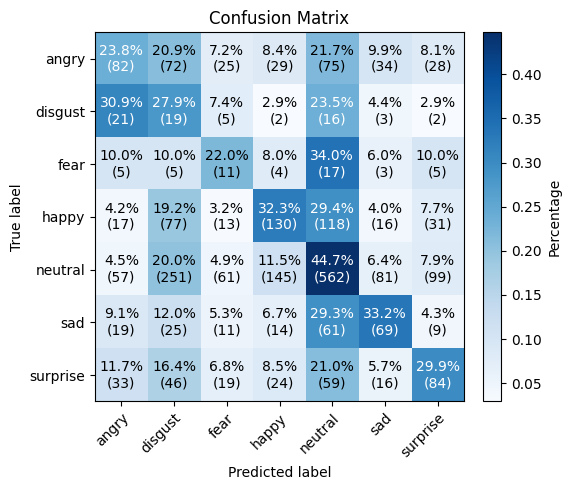

In [18]:
print(classification_report(meld_test['label'], [i[0][0] for i in meld_test['fused_no_face']]))
plot_confusion_matrix(meld_test['label'], [i[0][0] for i in meld_test['fused_no_face']])

              precision    recall  f1-score   support

       angry       0.36      0.30      0.33       345
     disgust       0.13      0.18      0.15        68
        fear       0.12      0.26      0.16        50
       happy       0.37      0.39      0.38       402
     neutral       0.62      0.57      0.59      1256
         sad       0.32      0.37      0.34       208
    surprise       0.32      0.37      0.34       281

    accuracy                           0.45      2610
   macro avg       0.32      0.35      0.33      2610
weighted avg       0.47      0.45      0.46      2610



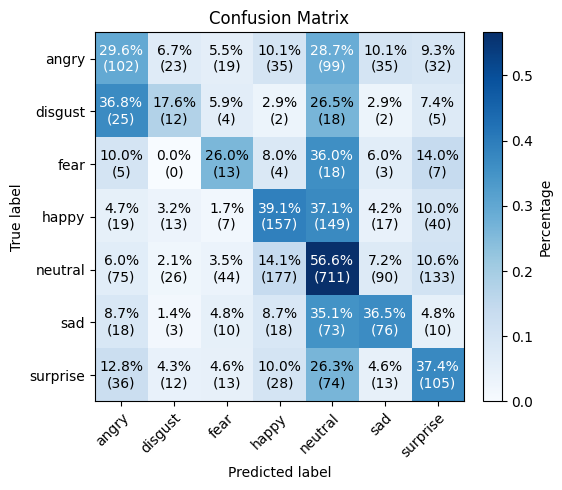

In [19]:
print(classification_report(meld_test['label'], [i[1][0] for i in meld_test['fused_no_face']]))
plot_confusion_matrix(meld_test['label'], [i[1][0] for i in meld_test['fused_no_face']])

In [ ]:
from src.evaluation import plot_confusion_matrix
from sklearn.metrics import classification_report


def safe_float_dict(d):
    """Convert dict values to float if they are strings."""
    if isinstance(d, dict):
        return {k: float(v) for k, v in d.items()}
    return d

def get_final_pred(preds):
    audio_emo, face_emo, text_emo = preds

    # Ensure numeric values
    audio_emo = safe_float_dict(audio_emo)
    text_emo = safe_float_dict(text_emo)
    face_emo = [safe_float_dict(i['emotions']) for i in face_emo]

    tav_input = {'audio': audio_emo, 'video': face_emo, 'text': text_emo}
    ta_input = {'audio': audio_emo, 'text': text_emo}

    pred_tav = fusion.fuse(tav_input)
    pred_ta = fusion.fuse(ta_input)

    return (pred_tav, pred_ta)



#meld_test['fused'] = meld_test['preds'].progress_apply(get_final_pred)


100%|██████████| 2610/2610 [00:00<00:00, 58613.54it/s]


In [ ]:
# meld_test['final_fer'] = meld_test['preds'].apply(lambda x: x['frames']=x)
meld_test['final_fer'] = meld_test['fused'].apply(lambda x: x[0][0])
print(classification_report(meld_test['label'], meld_test['final_fer']))
plot_confusion_matrix(meld_test['label'], meld_test['final_fer'])

In [ ]:
meld_test['final_tav'] = meld_test['fused'].apply(lambda x: x[0][0])
meld_test['final_ta'] = meld_test['fused'].apply(lambda x: x[1][0])

              precision    recall  f1-score   support

       angry       0.35      0.21      0.26       345
     disgust       0.04      0.37      0.07        68
        fear       0.08      0.20      0.11        50
       happy       0.36      0.33      0.34       402
     neutral       0.61      0.42      0.50      1256
         sad       0.31      0.30      0.31       208
    surprise       0.31      0.27      0.29       281

    accuracy                           0.35      2610
   macro avg       0.30      0.30      0.27      2610
weighted avg       0.46      0.35      0.39      2610



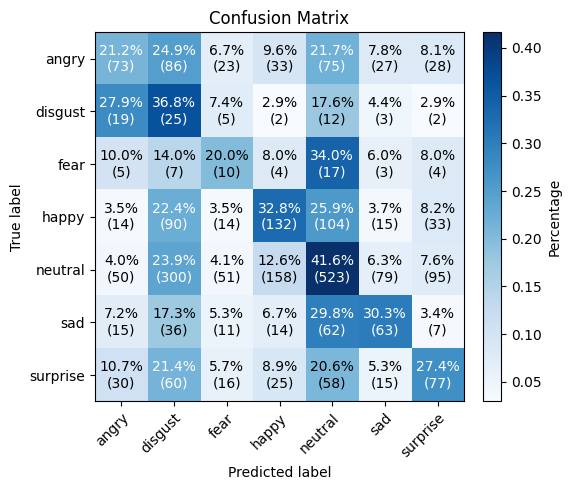

In [7]:
print(classification_report(meld_test['label'], meld_test['final_tav']))
plot_confusion_matrix(meld_test['label'], meld_test['final_tav'])

              precision    recall  f1-score   support

       angry       0.36      0.30      0.33       345
     disgust       0.13      0.18      0.15        68
        fear       0.12      0.26      0.16        50
       happy       0.37      0.39      0.38       402
     neutral       0.62      0.57      0.59      1256
         sad       0.32      0.37      0.34       208
    surprise       0.32      0.37      0.34       281

    accuracy                           0.45      2610
   macro avg       0.32      0.35      0.33      2610
weighted avg       0.47      0.45      0.46      2610



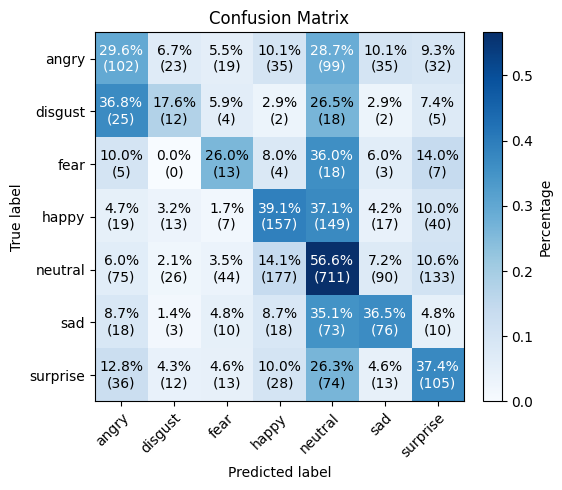

In [8]:
print(classification_report(meld_test['label'], meld_test['final_ta']))
plot_confusion_matrix(meld_test['label'], meld_test['final_ta'])

## IEMOCAP

In [9]:
from src.data_loading import load_iemocap
iemocap = filter_emotions(load_iemocap())

iemocap['preds'] = iemocap['filename'].progress_apply(multimodal_er)
iemocap.to_csv("iemocap_test_late_fusion_preds.csv", index=False)

  0%|          | 1/4639 [00:02<3:16:34,  2.54s/it]


KeyError: 'frames'

In [ ]:
iemocap['final_tav'] = iemocap['fused'].apply(lambda x: x[0][0])
iemocap['final_ta'] = iemocap['fused'].apply(lambda x: x[1][0])

## One example

In [6]:
file_data = fp.process_file(meld_test.iloc[0]['filename'])

MoviePy - Writing audio in /var/folders/ry/9hpdp04n0n58r6p626cfk2gh0000gn/T/tmpn673r9j3.wav


MoviePy - Done.


In [7]:
audio_emo = audio_recognizer.analyze(file_data["audio"]['raw'], 16000)
audio_emo

'neutral'

In [ ]:
face_emo = vision_recognizer.analyze_video_frames(file_data["frames"])
face_emo

Action: emotion: 100%|██████████| 1/1 [00:00<00:00, 36.88it/s]


[{'emotions': {'angry': 0.0,
   'disgust': 1.4464581326036336e-20,
   'fear': 100.0,
   'happy': 0.0,
   'sad': 2.8519372627378026e-09,
   'surprise': 7.247253280605571e-33,
   'neutral': 6.12351934245215e-14},
  'dominant_emotion': 'fear'},
 {'emotions': {'angry': 1.6297385589751985e-24,
   'disgust': 99.99915361404419,
   'fear': 0.0008520142728229985,
   'happy': 2.2368856805416004e-33,
   'sad': 9.684274576756216e-20,
   'surprise': 7.769576801533988e-28,
   'neutral': 0.0},
  'dominant_emotion': 'disgust'},
 {'emotions': {'angry': 4.301996736551802e-28,
   'disgust': 3.0873564121902675e-09,
   'fear': 76.4445424079895,
   'happy': 6.049487318578226e-25,
   'sad': 23.55545461177826,
   'surprise': 6.61364265865379e-25,
   'neutral': 3.2184810158495156e-15},
  'dominant_emotion': 'fear'}]

In [ ]:
text_emo = text_recognizer.analyze(file_data["text"])
text_emo

'neutral'

In [ ]:
preds = {
    'text': text_emo,
    'audio': audio_emo,
    'video': [i['emotions'] for i in face_emo]
}
label, probs, top3 = fusion.fuse(preds)
print("🎯 Final label:", label)
print("📊 Probabilities:", probs)
print("🏆 Top-3:", top3)

🎯 Final label: neutral
📊 Probabilities: {'neutral': 0.41382028391121123, 'happy': 0.30037473039789314, 'angry': 0.0010982991114847306, 'disgust': 5.855429157193812e-07, 'fear': 0.1232582616366992, 'sad': 0.161407970860896, 'surprise': 3.986853890003523e-05}
🏆 Top-3: [('neutral', 0.41382028391121123), ('happy', 0.30037473039789314), ('sad', 0.161407970860896)]


In [10]:
meld_test

,Sr No.,Utterance,Speaker,Emotion,Sentiment,Dialogue_ID,Utterance_ID,Season,Episode,StartTime,EndTime,filename,label
0,1,Why do all youre coffee mugs have numbers on ...,Mark,surprise,positive,0,0,3,19,"00:14:38,127","00:14:40,378",/Users/sofiafernandes/.cache/kagglehub/dataset...,surprise
1,2,Oh. Thats so Monica can keep track. That way ...,Rachel,anger,negative,0,1,3,19,"00:14:40,629","00:14:47,385",/Users/sofiafernandes/.cache/kagglehub/dataset...,angry
2,3,Y'know what?,Rachel,neutral,neutral,0,2,3,19,"00:14:56,353","00:14:57,520",/Users/sofiafernandes/.cache/kagglehub/dataset...,neutral
3,19,"Come on, Lydia, you can do it.",Joey,neutral,neutral,1,0,1,23,"0:10:44,769","0:10:46,146",/Users/sofiafernandes/.cache/kagglehub/dataset...,neutral
4,20,Push!,Joey,joy,positive,1,1,1,23,"0:10:46,146","0:10:46,833",/Users/sofiafernandes/.cache/kagglehub/dataset...,happy
...,...,...,...,...,...,...,...,...,...,...,...,...,...
2605,2760,"Yeah, I mean, come on Ross, no one will even n...",Rachel,neutral,neutral,279,11,6,4,"00:14:35,457","00:14:40,211",/Users/sofiafernandes/.cache/kagglehub/dataset...,neutral
2606,2761,They’re not listening too me?,Ross,surprise,negative,279,12,6,4,"00:14:42,256","00:14:43,840",/Users/sofiafernandes/.cache/kagglehub/dataset...,surprise
2607,2762,Of course they’re listening to you! Everybody ...,Rachel,neutral,neutral,279,13,6,4,"00:14:44,008","00:14:48,511",/Users/sofiafernandes/.cache/kagglehub/dataset...,neutral
2608,2763,Monica you really think I should try this phas...,Ross,neutral,neutral,279,14,6,4,"00:14:48,138","00:14:52,390",/Users/sofiafernandes/.cache/kagglehub/dataset...,neutral
